# Basic imports and global variables

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler, TensorBoard
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import datetime
import glob
import random
%matplotlib inline

In [2]:
DATASET_FOLDER = os.path.join("Dataset", "Brain_MRI")
MODEL_FOLDER = "Models"
SEED = 2020

# Data exploration

In [3]:
brain_df = pd.read_csv(os.path.join(DATASET_FOLDER, 'data_mask.csv'))

In [4]:
brain_df.info()

&lt;class &#39;pandas.core.frame.DataFrame&#39;&gt;
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [5]:
brain_df.head(10)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
5,TCGA_CS_5395_19981004,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1_...,0
6,TCGA_CS_5395_19981004,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1.tif,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1_...,0
7,TCGA_CS_5395_19981004,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1_...,0
8,TCGA_CS_5395_19981004,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1.tif,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1_...,0
9,TCGA_CS_5395_19981004,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1.tif,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1_...,0


In [6]:
brain_df.mask_path[1] # Path to the brain MRI image

&#39;TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif&#39;

In [7]:
brain_df.image_path[1] # Path to the segmentation mask

&#39;TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif&#39;

In [8]:
brain_df["mask"].value_counts()

0    2556
1    1373
Name: mask, dtype: int64

In [9]:
brain_df['mask'].value_counts().index

Int64Index([0, 1], dtype=&#39;int64&#39;)

In [10]:
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

## Visualization

&lt;matplotlib.image.AxesImage at 0x244a1b3df88&gt;

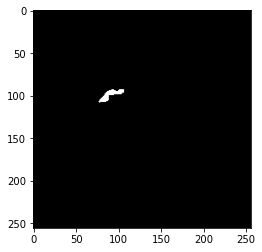

In [11]:
plt.imshow(cv2.imread(os.path.join(DATASET_FOLDER, brain_df.mask_path[623])))

### Visualize image and mask

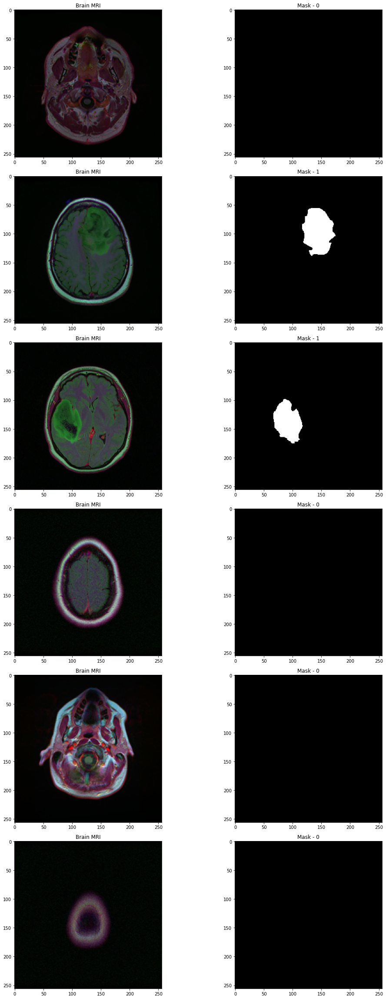

In [12]:
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(os.path.join(DATASET_FOLDER, brain_df.image_path[i]))) # show MRI 
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(os.path.join(DATASET_FOLDER, brain_df.mask_path[i]))) # Show corresponding mask
  count += 1

fig.tight_layout()

### Visualize image, mask and image with mask on top

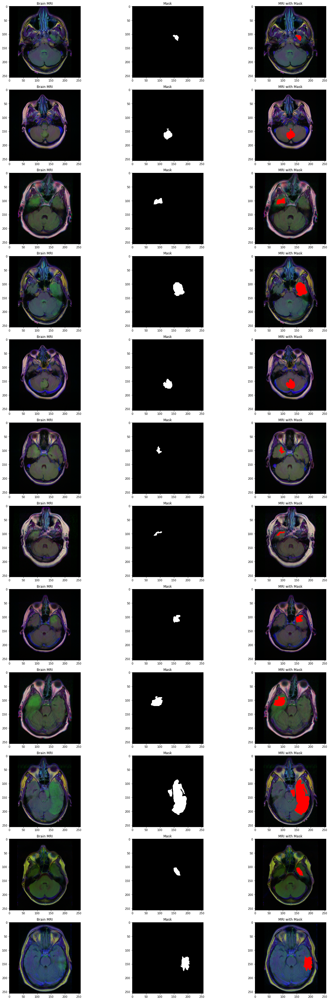

In [13]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <12:
    img = io.imread(os.path.join(DATASET_FOLDER, brain_df.image_path[i]))
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(img)

    mask = io.imread(os.path.join(DATASET_FOLDER, brain_df.mask_path[i]))
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

    
    img[mask == 255] = (255, 0, 0)
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(img)
    count+=1

fig.tight_layout()


## Data cleaning and transforming

In [14]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [15]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [16]:
brain_df_train['image_path'] = brain_df_train['image_path'].apply(lambda x: os.path.join(DATASET_FOLDER, x))
brain_df_train['mask_path'] = brain_df_train['mask_path'].apply(lambda x: os.path.join(DATASET_FOLDER, x))

In [17]:
brain_df_train.info()

&lt;class &#39;pandas.core.frame.DataFrame&#39;&gt;
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [18]:
y = [int(value) for value in brain_df_train['mask']]

In [19]:
# split the data into train and test data, use strtify to get the same data distribution in both sets

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.1, random_state = SEED, stratify = y)

## create a image generator

In [20]:
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which applies the Resnet image preprocessing function and makes validation split of 0.15
datagen = ImageDataGenerator(validation_split = 0.15, preprocessing_function=tf.keras.applications.resnet_v2.preprocess_input)

In [21]:
BATCH_SIZE = 16

In [22]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=BATCH_SIZE,
shuffle=True,
class_mode="categorical",
seed=SEED,
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=BATCH_SIZE,
shuffle=True,
class_mode="categorical",
seed=SEED,
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet_v2.preprocess_input)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=BATCH_SIZE,
shuffle=False,
class_mode='categorical',
target_size=(256,256))

Found 3006 validated image filenames belonging to 2 classes.
Found 530 validated image filenames belonging to 2 classes.
Found 393 validated image filenames belonging to 2 classes.


# Classification Model

In [23]:
# Get the ResNet101 base model
basemodel = ResNet101V2(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

In [24]:
basemodel.summary()

Model: &quot;resnet101v2&quot;
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 130, 130, 64) 0           conv1_conv[0][0]                 
______________________________________________________________________________

In [25]:
# freeze the base model weights
for layer in basemodel.layers:
  layers.trainable = False

In [26]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [27]:
model.summary()

Model: &quot;functional_1&quot;
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 130, 130, 64) 0           conv1_conv[0][0]                 
_____________________________________________________________________________

In [28]:
# compile the model
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss = 'categorical_crossentropy', optimizer=opt, metrics= ["accuracy"])

In [29]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)
# use ReduceLROnPlateau to dynamically lower learning rate when validation loss doesn't diminish after 5 epochs
reduceLr = ReduceLROnPlateau(monitor='val_loss', mode='min', verbose=1, patience=5, factor=0.5, min_lr=0.0001)
# save the best model with least validation loss
checkpointer = ModelCheckpoint(filepath= os.path.join( MODEL_FOLDER, "classifier-resnet-weights.hdf5"), verbose=1, save_best_only=True)
# use tensorboard
classification_log_dir = os.path.join("logs", "classification", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard = TensorBoard(log_dir=classification_log_dir, histogram_freq=1)

In [30]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // BATCH_SIZE, epochs = 50, validation_data= valid_generator, validation_steps= valid_generator.n // BATCH_SIZE, callbacks=[checkpointer, earlystopping, reduceLr, tensorboard])

Epoch 1/50
  1/187 [..............................] - ETA: 0s - loss: 0.7572 - accuracy: 0.5625WARNING:tensorflow:From C:\ProgramData\Miniconda3\lib\site-packages\tensorflow\python\ops\summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
187/187 [==============================] - ETA: 0s - loss: 0.7927 - accuracy: 0.6813
Epoch 00001: val_loss improved from inf to 2171.86548, saving model to Models\classifier-resnet-weights.hdf5
187/187 [==============================] - 51s 271ms/step - loss: 0.7927 - accuracy: 0.6813 - val_loss: 2171.8655 - val_accuracy: 0.3807
Epoch 2/50
187/187 [==============================] - ETA: 0s - loss: 0.5449 - accuracy: 0.7759
Epoch 00002: val_loss improved from 2171.86548 to 0.63721, saving model to Models\classifier-resnet-weights.hdf5
187/187 [==============================] - 50s 269ms/step - loss: 0.5449 - accurac

In [31]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open(os.path.join(MODEL_FOLDER, "classifier-resnet-model.json"),"w") as json_file:
  json_file.write(model_json)

In [32]:
# Load pretrained model (instead of training the model for 1+ hours) 
with open(os.path.join(MODEL_FOLDER, 'classifier-resnet-model.json'), 'r') as json_file:
    json_savedModel= json_file.read()
# load the model  
model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights(os.path.join(MODEL_FOLDER, 'classifier-resnet-weights.hdf5'))
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [33]:
test_predict = model.predict(test_generator, steps = test_generator.n // BATCH_SIZE, verbose =1)

 1/24 [&gt;.............................] - ETA: 0sWARNING:tensorflow:Callbacks method `on_predict_batch_end` is slow compared to the batch time (batch time: 0.0100s vs `on_predict_batch_end` time: 0.0460s). Check your callbacks.
24/24 [==============================] - 1s 50ms/step


In [34]:
test_predict.shape

(384, 2)

In [35]:
test_predict

array([[1.33644317e-05, 9.99986649e-01],
       [1.92653606e-05, 9.99980688e-01],
       [9.97357666e-01, 2.64229486e-03],
       [9.55831885e-01, 4.41681817e-02],
       [9.68387604e-01, 3.16124484e-02],
       [9.99863744e-01, 1.36276780e-04],
       [9.29607630e-01, 7.03923479e-02],
       [4.23829895e-12, 1.00000000e+00],
       [9.99500990e-01, 4.99035639e-04],
       [9.96890247e-01, 3.10977409e-03],
       [8.99303734e-01, 1.00696273e-01],
       [5.78794539e-01, 4.21205431e-01],
       [9.99866962e-01, 1.32973684e-04],
       [9.98958588e-01, 1.04134763e-03],
       [9.98831809e-01, 1.16818317e-03],
       [1.52709775e-10, 1.00000000e+00],
       [6.49265289e-01, 3.50734711e-01],
       [5.37446709e-08, 1.00000000e+00],
       [4.22148127e-03, 9.95778561e-01],
       [9.97732520e-01, 2.26745359e-03],
       [9.50131893e-01, 4.98681404e-02],
       [5.02823526e-03, 9.94971752e-01],
       [1.19873046e-04, 9.99880075e-01],
       [2.22851145e-06, 9.99997735e-01],
       [9.800485

In [36]:
# Obtain the predicted class from the model prediction
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [37]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

384

In [38]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9453125

&lt;AxesSubplot:&gt;

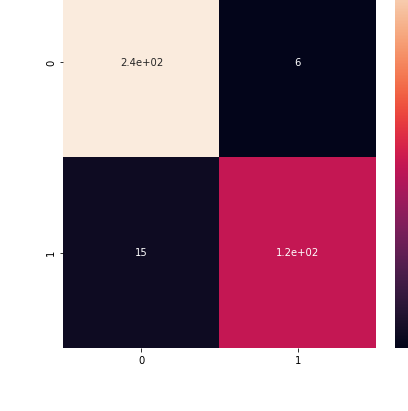

In [39]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [40]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.94      0.98      0.96       249
           1       0.95      0.89      0.92       135

   micro avg       0.95      0.95      0.95       384
   macro avg       0.95      0.93      0.94       384
weighted avg       0.95      0.95      0.94       384



# Segmentation model

In [41]:
def tversky(y_true, y_pred, smooth = 1e-6):
    y_true_pos = K.flatten(tf.cast(y_true, tf.float32))
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [42]:
class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, ids , mask, image_dir = './', batch_size = 16, img_h = 256, img_w = 256, shuffle = True):

    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    'Get the number of batches per epoch'

    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    'Generate a batch of data'

    #generate index of batch_size length
    indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

    #get the ImageId corresponding to the indexes created above based on batch size
    list_ids = [self.ids[i] for i in indexes]

    #get the MaskId corresponding to the indexes created above based on batch size
    list_mask = [self.mask[i] for i in indexes]


    #generate data for the X(features) and y(label)
    X, y = self.__data_generation(list_ids, list_mask)

    #returning the data
    return X, y

  def on_epoch_end(self):
    'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'
    
    #getting the array of indices based on the input dataframe
    self.indexes = np.arange(len(self.ids))

    #if shuffle is true, shuffle the indices
    if self.shuffle:
      np.random.shuffle(self.indexes, )

  def __data_generation(self, list_ids, list_mask):
    'generate the data corresponding the indexes in a given batch of images'

    # create empty arrays of shape (batch_size,height,width,depth) 
    #Depth is 3 for input and depth is taken as 1 for output becasue mask consist only of 1 channel.
    X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
    y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

    #iterate through the dataframe rows, whose size is equal to the batch_size
    for i in range(len(list_ids)):
      #path of the image
      img_path = os.path.join(self.image_dir, str(list_ids[i]))
      
      #mask path
      mask_path = os.path.join(self.image_dir, str(list_mask[i]))
      
      #reading the original image and the corresponding mask image
      img = io.imread(img_path)
      mask = io.imread(mask_path)

      #resizing and coverting them to array of type float64
      img = cv2.resize(img,(self.img_h,self.img_w))
      img = np.array(img, dtype = np.float64)
      
      mask = cv2.resize(mask,(self.img_h,self.img_w))
      mask = np.array(mask, dtype = np.float64)

      #standardising 
      img -= img.mean()
      img /= img.std()
      
      mask -= mask.mean()
      mask /= mask.std()
      
      #Adding image to the empty array
      X[i,] = img
      
      #expanding the dimnesion of the image from (256,256) to (256,256,1)
      y[i,] = np.expand_dims(mask, axis = 2)
    
    #normalizing y
    y = (y > 0).astype(int)

    return X, y

In [43]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [44]:
from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15, random_state = SEED)
X_test, X_val = train_test_split(X_val, test_size=0.5, random_state = SEED)

In [45]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [46]:
training_generator = DataGenerator(train_ids,train_mask, image_dir=DATASET_FOLDER, batch_size=BATCH_SIZE)
validation_generator = DataGenerator(val_ids,val_mask, image_dir=DATASET_FOLDER, batch_size=BATCH_SIZE)

In [47]:
def resblock(X, f):
  
  # make a copy of input
  X_copy = X

  # main path
  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X) 

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [48]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [49]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [50]:
model_seg.summary()

Model: &quot;functional_3&quot;
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        batch_normalization[0][0]        
_____________________________________________________________________________

In [51]:
# Compile the model
adam = tf.keras.optimizers.Adam(lr = 0.01, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [52]:
earlystopping = EarlyStopping(monitor='val_tversky', mode='max', verbose=1, patience=30)
reduceLr = ReduceLROnPlateau(monitor='val_tversky', mode='max', verbose=1, patience=10, factor=0.5, min_lr=0.0001)
checkpointer = ModelCheckpoint(monitor='val_tversky', mode='max', filepath=os.path.join(MODEL_FOLDER, "ResUNet-weights.hdf5"), verbose=1, save_best_only=True)
# use tensorboard
segmentation_log_dir = os.path.join("logs", "segmentation", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard = TensorBoard(log_dir=segmentation_log_dir, histogram_freq=1)

In [53]:
history = model_seg.fit(training_generator, epochs = 100, validation_data = validation_generator, callbacks = [checkpointer, earlystopping, reduceLr, tensorboard])

Epoch 1/100
72/72 [==============================] - ETA: 0s - loss: 0.9235 - tversky: 0.1005
Epoch 00001: val_tversky improved from -inf to 0.09787, saving model to Models\ResUNet-weights.hdf5
72/72 [==============================] - 9s 132ms/step - loss: 0.9235 - tversky: 0.1005 - val_loss: 0.9256 - val_tversky: 0.0979
Epoch 2/100
72/72 [==============================] - ETA: 0s - loss: 0.8718 - tversky: 0.1670
Epoch 00002: val_tversky improved from 0.09787 to 0.14884, saving model to Models\ResUNet-weights.hdf5
72/72 [==============================] - 8s 113ms/step - loss: 0.8718 - tversky: 0.1670 - val_loss: 0.8861 - val_tversky: 0.1488
Epoch 3/100
72/72 [==============================] - ETA: 0s - loss: 0.8162 - tversky: 0.2369
Epoch 00003: val_tversky improved from 0.14884 to 0.24696, saving model to Models\ResUNet-weights.hdf5
72/72 [==============================] - 8s 113ms/step - loss: 0.8162 - tversky: 0.2369 - val_loss: 0.8083 - val_tversky: 0.2470
Epoch 4/100
72/72 [======

In [54]:
# save the model architecture to json file for future use

model_json = model_seg.to_json()
with open(os.path.join(MODEL_FOLDER, "ResUNet-model.json"),"w") as json_file:
  json_file.write(model_json)

In [57]:
def prediction(test, model, model_seg):

  #Creating empty list to store the results
  mask = []
  image_id = []
  has_mask = []

  #iterating through each image in the test data
  for i in test.image_path:

    path = str(i)

    #reading the image
    img = io.imread(path)

    #Normalizing the image
    img = tf.keras.applications.resnet_v2.preprocess_input(img)

    #Reshaping the image
    img = cv2.resize(img,(256,256))

    #Converting the image into array
    img = np.array(img, dtype = np.float64)
    
    #reshaping the image from 256,256,3 to 1,256,256,3
    img = np.reshape(img, (1,256,256,3))

    #making prediction on the image
    is_defect = model.predict(img)

    #if tumour is not present we append the details of the image to the list
    if np.argmax(is_defect) == 0:
      image_id.append(i)
      has_mask.append(0)
      mask.append('No mask')
      continue

    #Read the image
    img = io.imread(path)

    #Creating a empty array of shape 1,256,256,1
    X = np.empty((1, 256, 256, 3))

    #resizing the image and coverting them to array of type float64
    img = cv2.resize(img,(256,256))
    img = np.array(img, dtype = np.float64)

    #standardising the image
    img -= img.mean()
    img /= img.std()

    #converting the shape of image from 256,256,3 to 1,256,256,3
    X[0,] = img

    #make prediction
    predict = model_seg.predict(X)

    #if the sum of predicted values is equal to 0 then there is no tumour
    if predict.round().astype(int).sum() == 0:
        image_id.append(i)
        has_mask.append(0)
        mask.append('No mask')
    else:
    #if the sum of pixel values are more than 0, then there is tumour
        image_id.append(i)
        has_mask.append(1)
        mask.append(predict)


  return image_id, mask, has_mask

In [58]:
image_id, mask, has_mask = prediction(test, model, model_seg)

In [59]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,Dataset\Brain_MRI\TCGA_DU_8168_19970503/TCGA_D...,"[[[[1.3107453e-06], [1.0527263e-05], [1.494057...",1
1,Dataset\Brain_MRI\TCGA_DU_7014_19860618/TCGA_D...,"[[[[2.3864902e-06], [5.5346595e-06], [5.233973...",1
2,Dataset\Brain_MRI\TCGA_DU_7298_19910324/TCGA_D...,No mask,0
3,Dataset\Brain_MRI\TCGA_DU_7299_19910417/TCGA_D...,No mask,0
4,Dataset\Brain_MRI\TCGA_DU_6405_19851005/TCGA_D...,No mask,0
...,...,...,...
388,Dataset\Brain_MRI\TCGA_DU_7299_19910417/TCGA_D...,No mask,0
389,Dataset\Brain_MRI\TCGA_HT_8563_19981209/TCGA_H...,"[[[[2.2543009e-06], [1.2301952e-05], [1.412252...",1
390,Dataset\Brain_MRI\TCGA_FG_6688_20020215/TCGA_F...,No mask,0
391,Dataset\Brain_MRI\TCGA_DU_7302_19911203/TCGA_D...,No mask,0


In [60]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,Dataset\Brain_MRI\TCGA_DU_8168_19970503/TCGA_D...,Dataset\Brain_MRI\TCGA_DU_8168_19970503/TCGA_D...,1,"[[[[1.3107453e-06], [1.0527263e-05], [1.494057...",1
1,Dataset\Brain_MRI\TCGA_DU_7014_19860618/TCGA_D...,Dataset\Brain_MRI\TCGA_DU_7014_19860618/TCGA_D...,1,"[[[[2.3864902e-06], [5.5346595e-06], [5.233973...",1
2,Dataset\Brain_MRI\TCGA_DU_7298_19910324/TCGA_D...,Dataset\Brain_MRI\TCGA_DU_7298_19910324/TCGA_D...,0,No mask,0
3,Dataset\Brain_MRI\TCGA_DU_7299_19910417/TCGA_D...,Dataset\Brain_MRI\TCGA_DU_7299_19910417/TCGA_D...,0,No mask,0
4,Dataset\Brain_MRI\TCGA_DU_6405_19851005/TCGA_D...,Dataset\Brain_MRI\TCGA_DU_6405_19851005/TCGA_D...,0,No mask,0


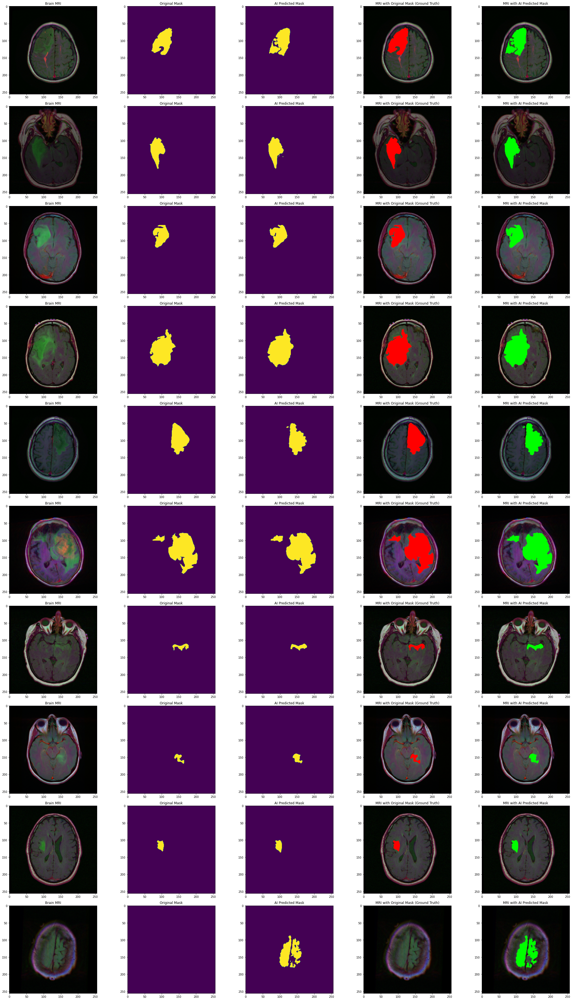

In [61]:
count = 0 
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image 
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image 
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)
    
    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()